In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
import sys
import os
sys.path.append("/home/zhiyin/tml-fencing")
from src.distance import Sam2FencerTracker, load_prompt_points
import numpy as np

tracker = Sam2FencerTracker(
    sam2_checkpoint="../checkpoints/sam2.1_hiera_large.pt",
    sam2_config="./configs/sam2.1/sam2.1_hiera_l.yaml",
    # optional, below are the default values
    short_line_tol=0.01,
    slope_border_max=0.4,
    min_sep_px=100,
    min_line_length=100,
    max_line_length=450,
    max_ext_line_length=500,
    min_tilt_deg=10,
    window_thresh=5,
    std_thresh=2.0,
    verbose=False,
)

In [ ]:
import cv2
import plotly.express as px
import numpy as np 

# plotly visualize the first frame
CLIP_IDX = 16
video_path = f"/home/zhiyin/tml-fencing/data_0428/24seoulgpms_l16_pakdaman_bahgat_yellow/clips/clip_{CLIP_IDX}.mp4"
video_dir  = video_path.replace(".mp4", "/")
f_idx = 0

# Hand label prompts
frame_names = tracker.extract_frames(video_path, video_dir)
frame =  cv2.imread(os.path.join(video_dir, frame_names[f_idx]))
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
fig = px.imshow(frame)
fig.update_traces(
    hovertemplate=(
        '(%{x}, %{y})<br>' +
        'R: %{z[0]}  G: %{z[1]}  B: %{z[2]}<extra></extra>'
    )
)
fig.update_layout(coloraxis_showscale=False)
fig.show()

In [ ]:
print(video_dir)

In [ ]:
prompt_points = load_prompt_points(
    f"{video_dir}/prompt_points.json"
)

print(f"Prompt points loaded from JSON file: {prompt_points}")
tracker.verbose = False
df = tracker.track_video(
    video_path=video_path,
    video_dir=video_dir,
    prompt_points=prompt_points,
)
# if output path does not exist, create it
output_dir = video_dir.replace('data', 'output_wham')
if not os.path.exists(output_dir):
    os.makedirs(output_dir, exist_ok=True)
# save the dataframe to a csv file
output_csv = os.path.join(output_dir, "fencer_distances.csv")
df.to_csv(output_csv, index=False)
print(f"Saved results to {output_csv}.")


In [ ]:
# # clip 18
# prompt_points = {
#     "en_garde_left": {"points": np.array([(417,753)]), "frame": 0},
#     "middle": {"points": np.array([(1002,753)]), "frame": 0},  # fixed missing key
#     "en_garde_right": {"points": np.array([(1582,746)]), "frame": 0},  # updated to include frame
#     "fencer_left": {"points": np.array([[249, 533]]), "frame": 0},  # updated fencer1 prompt
#     "fencer_right": {"points": np.array([[1242, 495]]), "frame": 0},  # updated fencer2 prompt
#     "warning_left": None,
#     "warning_right": {"points": np.array([[1877, 581]]), "frame": 70},  # updated warning_right prompt
# }

# clip 9
# prompt_points = {
#     "en_garde_left": {"points": np.array([(430,756)], dtype=np.float32), "frame": 0},
#     "middle": {"points": np.array([(1012,752)], dtype=np.float32), "frame": 0},  # updated dtype
#     "en_garde_right": {"points": np.array([(1597,749)], dtype=np.float32), "frame": 0},
#     # "fencer_left": {"points": np.array([[270, 494]], dtype=np.float32), "frame": 0},  # updated fencer1 prompt
#     # "fencer_right": {"points": np.array([[1761, 470]], dtype=np.float32), "frame": 0},   # updated fencer2 prompt
#     # "warning_left": {"points": np.array([[360, 585]], dtype=np.float32), "frame": 118}, 
#     # "warning_right": None,
# }

# clip 11
#  prompt_points = {
#     "en_garde_left": {"points": np.array([(404,758)], dtype=np.float32), "frame": 0},
#     "middle": {"points": np.array([(989,740)], dtype=np.float32), "frame": 0},  # updated dtype
#     "en_garde_right": {"points": np.array([(1570,749)], dtype=np.float32), "frame": 0},
#     "warning_left": None, 
#     "warning_right": None,
# }


Prompt points loaded from JSON file: {'en_garde_left': {'points': array([[ 38, 837]]), 'frame': 0}, 'middle': {'points': array([[656, 830]]), 'frame': 0}, 'en_garde_right': {'points': array([[1245,  813]]), 'frame': 0}} at 
/home/zhiyin/tml-fencing/data_0428/24seoulgpms_l16_pakdaman_bahgat_yellow/clips/clip_2//prompt_points.json
Using frame 60 to compute prompt points


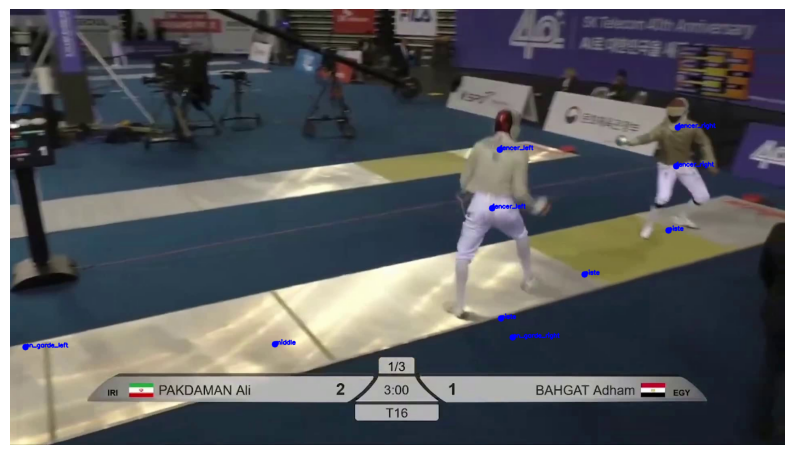

0: skipping warning_right due to confidence check with line length 85.7088564004087 and aspect ratio 222.9292347515722 and ext line length 930.5347031530638 and angle 29.3426217343535
Overlaying mask for en_garde_left: 7202 pixels
Overlaying mask for middle: 2913 pixels
Overlaying mask for en_garde_right: 4102 pixels
Overlaying mask for fencer_left: 80498 pixels
Overlaying mask for fencer_right: 61489 pixels
Overlaying mask for warning_right: 2498 pixels


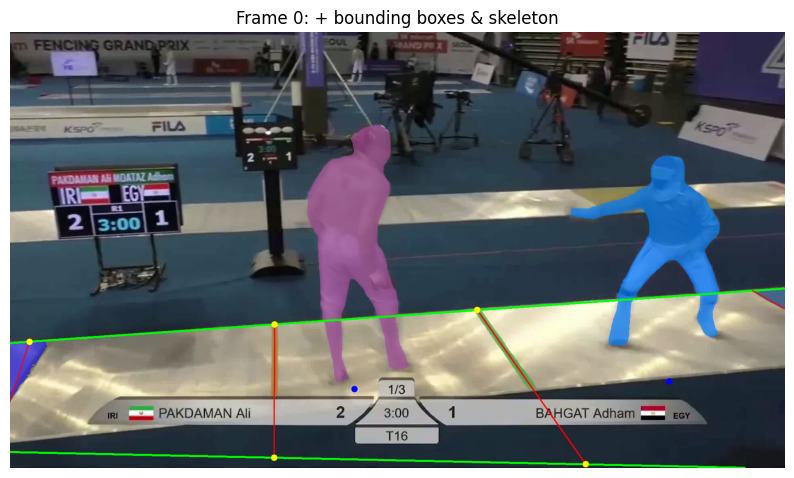

Prompt points loaded from JSON file: {'en_garde_left': {'points': array([[ 38, 837]]), 'frame': 0}, 'middle': {'points': array([[656, 830]]), 'frame': 0}, 'en_garde_right': {'points': array([[1245,  813]]), 'frame': 0}} at 
/home/zhiyin/tml-fencing/data_0428/24seoulgpms_l16_pakdaman_bahgat_yellow/clips/clip_2//prompt_points.json
Using frame 60 to compute prompt points


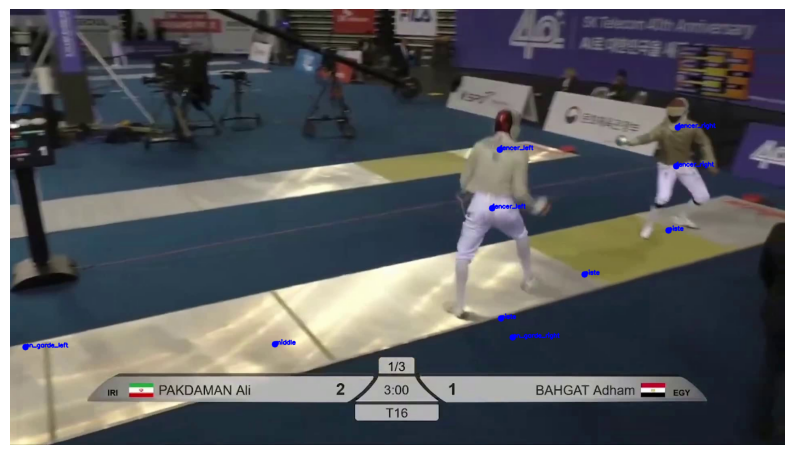

50: skipping warning_right due to confidence check with line length 391.2166460197783 and aspect ratio 4.1160553318796005 and ext line length 1151.307004772015 and angle 25.593644345524535
Overlaying mask for en_garde_left: 0 pixels
Overlaying mask for middle: 3998 pixels
Overlaying mask for en_garde_right: 3500 pixels
Overlaying mask for fencer_left: 64348 pixels
Overlaying mask for fencer_right: 37764 pixels
Overlaying mask for warning_right: 48568 pixels


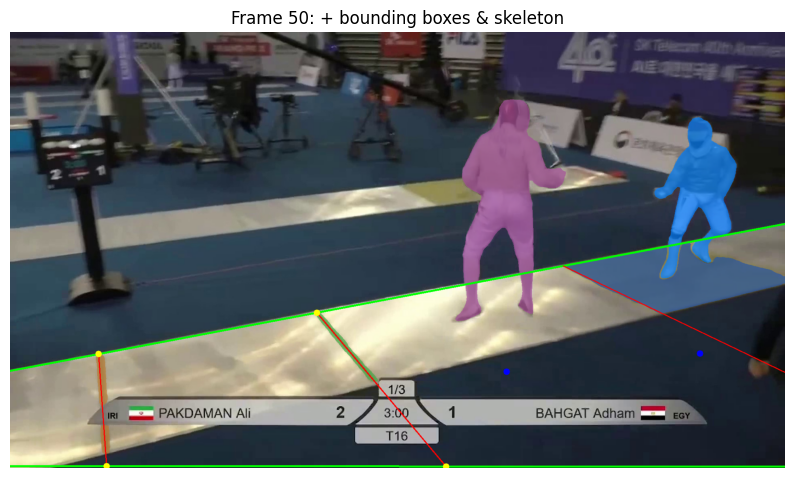

Prompt points loaded from JSON file: {'en_garde_left': {'points': array([[ 38, 837]]), 'frame': 0}, 'middle': {'points': array([[656, 830]]), 'frame': 0}, 'en_garde_right': {'points': array([[1245,  813]]), 'frame': 0}} at 
/home/zhiyin/tml-fencing/data_0428/24seoulgpms_l16_pakdaman_bahgat_yellow/clips/clip_2//prompt_points.json
Using frame 60 to compute prompt points


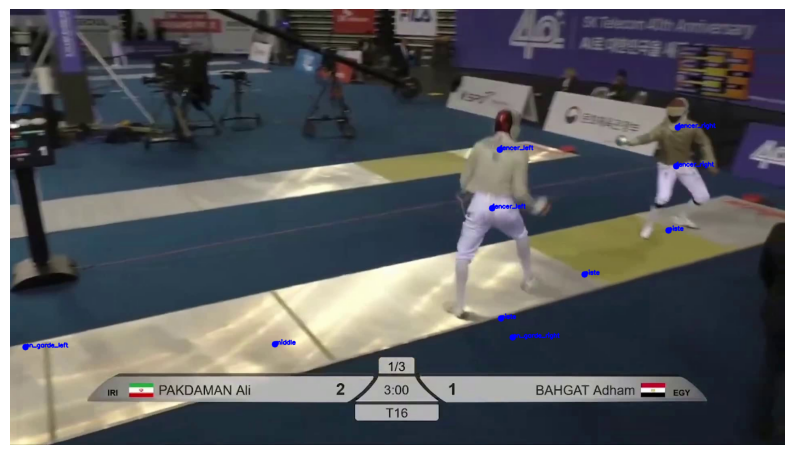

100: skipping warning_right due to confidence check with line length 402.68240078589366 and aspect ratio 3.8003796410002506 and ext line length 1248.4672272460207 and angle 23.87768664295582
[Frame 100] Warning: Not enough points for homography (2 points)
[Frame 100] Warning: Homography unavailable.
Overlaying mask for en_garde_left: 0 pixels
Overlaying mask for middle: 0 pixels
Overlaying mask for en_garde_right: 4183 pixels
Overlaying mask for fencer_left: 47048 pixels
Overlaying mask for fencer_right: 2878 pixels
Overlaying mask for warning_right: 43177 pixels


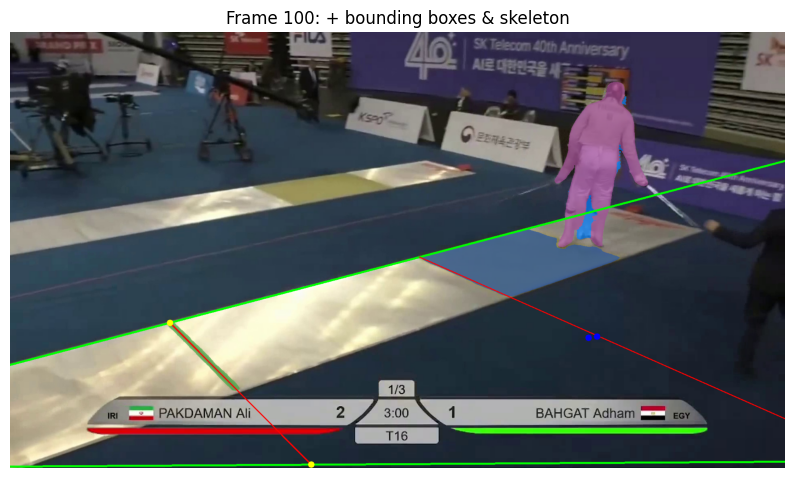

Prompt points loaded from JSON file: {'en_garde_left': {'points': array([[ 38, 837]]), 'frame': 0}, 'middle': {'points': array([[656, 830]]), 'frame': 0}, 'en_garde_right': {'points': array([[1245,  813]]), 'frame': 0}} at 
/home/zhiyin/tml-fencing/data_0428/24seoulgpms_l16_pakdaman_bahgat_yellow/clips/clip_2//prompt_points.json
Using frame 60 to compute prompt points


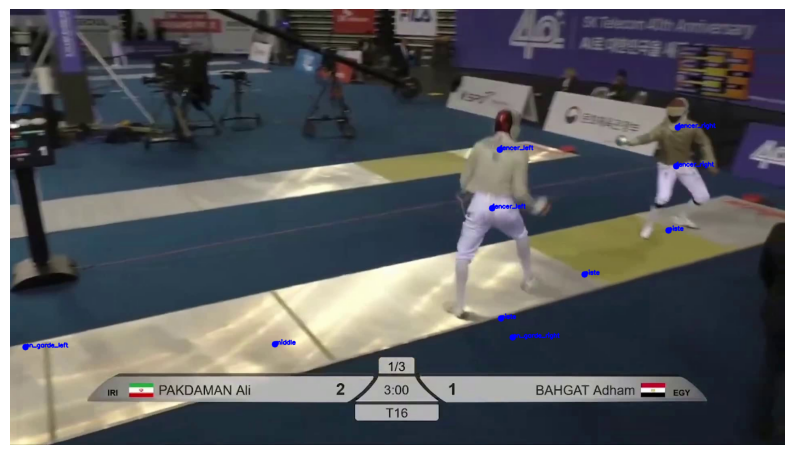

IndexError: list index out of range

In [13]:
# USE THIS TO VISUALIZE THE TRACKING OF WEIRD FRAMES
tracker.verbose = True
frame_names = tracker.extract_frames(video_path, video_dir)
tracker.video_frames = [cv2.imread(os.path.join(video_dir, f)) for f in frame_names]
    
for f_idx in range(0, 151, 50):
    prompt_points = load_prompt_points(
        f"{video_dir}/prompt_points.json"
    )
    print(f"Prompt points loaded from JSON file: {prompt_points} at \n{video_dir}/prompt_points.json")
    tracker._preprocess_prompt_points(prompt_points)
    tracker.track_image(video_dir, f_idx=f_idx)  # updated to use f_idx variable

# LOWER_BLUE_HSV = np.array([60,  20,  80]) 
# UPPER_BLUE_HSV = np.array([100,  80, 130])

# LOWER_RED_HSV, UPPER_RED_HSV = np.array([5, 100, 75]), np.array([50, 150, 255])

# import pickle
# frame_count = len(tracker.video_frames)
# video_segments = pickle.load(open(os.path.join(video_dir, "video_segments.pkl"), "rb"))
# tracker._map_name_to_obj_id_dict.update(pickle.load(open(os.path.join(video_dir, "name_to_obj_id.pkl"), "rb")))
            
# for f_idx in range(frame_count - 1, 100, -10):
#     tracker.lower_warning_hsv = LOWER_RED_HSV
#     tracker.upper_warning_hsv = UPPER_RED_HSV
#     # Get border lines from existing piste
#     frame = tracker.video_frames[f_idx]
#     H, W, _ = frame.shape    
#     # Now detect warning zone
#     piste_id = tracker._map_name_to_obj_id("piste")
#     piste_mask = video_segments[f_idx][piste_id][0].astype(np.uint8) * 255
#     piste_rgb = cv2.bitwise_and(frame, frame, mask=piste_mask)
#     piste_rgb = cv2.cvtColor(piste_rgb, cv2.COLOR_BGR2RGB)
#     border_lines = tracker._find_border_lines(piste_rgb, piste_mask)
#     warning_point = tracker._detect_warning_zone(frame, border_lines)
#     print(f"Warning point detected at {warning_point} in frame {f_idx}")


tracker.verbose = False

In [ ]:
import cv2
import numpy as np

# 1) Grab a small rectangle that sits squarely on the green stripe:
#    You’ll have to tweak these coords to match your frame & camera.
x1, y1 = 210, 582  
x2, y2 = 382, 633
patch = frame[y1:y2, x1:x2]
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
fig = px.imshow(frame)
fig.update_traces(
    hovertemplate=(
        '(%{x}, %{y})<br>' +
        'R: %{z[0]}  G: %{z[1]}  B: %{z[2]}<extra></extra>'
    )
)
fig.update_layout(coloraxis_showscale=False)
fig.show()

# 2) Convert to HSV and compute actual mins/maxs
hsv_patch = cv2.cvtColor(patch, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv_patch)
print(f"H: {h.min()} → {h.max()}")
print(f"S: {s.min()} → {s.max()}")
print(f"V: {v.min()} → {v.max()}")


# Automate prompting for en garde left, middle, en garde right lines
We decided not to do so because it is too unstable

In [ ]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt
# import os

# video_dir = "/home/zhiyin/tml-fencing/data_0427_zhiyin/23seoulgpws_l32_passaro_navarro/clips/"

# # List all .mp4 clips
# video_files = sorted([f for f in os.listdir(video_dir) if f.endswith(".mp4")])

# for video_file in video_files:
#     video_path = os.path.join(video_dir, video_file)
#     print(f"Processing {video_file}...")

#     cap = cv2.VideoCapture(video_path)
#     ret, frame = cap.read()
#     cap.release()

#     if not ret:
#         print(f"Failed to read {video_file}, skipping.")
#         continue

#     frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

#     # Crop piste region (optional)
#     H, W, _ = frame.shape
#     crop = frame[int(H*0.4):int(H*0.75), :]

#     # Color filtering: isolate brown lines
#     hsv = cv2.cvtColor(crop, cv2.COLOR_BGR2HSV)
#     lower_brown = np.array([10, 50, 50])
#     upper_brown = np.array([30, 255, 255])
#     brown_mask = cv2.inRange(hsv, lower_brown, upper_brown)

#     # Edge detection
#     edges = cv2.Canny(brown_mask, 50, 150, apertureSize=3)

#     # Line detection
#     lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=50, minLineLength=40, maxLineGap=10)

#     if lines is None:
#         print(f"No lines detected in {video_file}, skipping.")
#         continue

#     # Filter vertical-ish lines
#     filtered_lines = []
#     for line in lines:
#         x1, y1, x2, y2 = line[0]
#         if abs(x2 - x1) < abs(y2 - y1):
#             filtered_lines.append((x1, y1, x2, y2))

#     if len(filtered_lines) == 0:
#         print(f"No vertical lines found in {video_file}, skipping.")
#         continue

#     # Merge nearby lines
#     x_centers = np.array([(x1 + x2) / 2 for (x1, y1, x2, y2) in filtered_lines])
#     sorted_idx = np.argsort(x_centers)
#     x_centers = x_centers[sorted_idx]
#     filtered_lines = [filtered_lines[i] for i in sorted_idx]

#     merged_lines = []
#     MERGE_THRESHOLD = 50  # pixel distance for merging

#     group = []
#     last_x = None
#     for (x1, y1, x2, y2) in filtered_lines:
#         x_center = (x1 + x2) / 2
#         if last_x is None or abs(x_center - last_x) <= MERGE_THRESHOLD:
#             group.append((x1, y1, x2, y2))
#         else:
#             xs = [l[0] + l[2] for l in group]
#             ys = [l[1] + l[3] for l in group]
#             merged_lines.append((
#                 int(np.mean(xs)/2),
#                 int(np.mean(ys)/2),
#                 int(np.mean(xs)/2),
#                 int(np.mean(ys)/2),
#             ))
#             group = [(x1, y1, x2, y2)]
#         last_x = x_center

#     if group:
#         xs = [l[0] + l[2] for l in group]
#         ys = [l[1] + l[3] for l in group]
#         merged_lines.append((
#             int(np.mean(xs)/2),
#             int(np.mean(ys)/2),
#             int(np.mean(xs)/2),
#             int(np.mean(ys)/2),
#         ))

#     # Pick three key lines
#     merged_lines.sort(key=lambda l: (l[0] + l[2]) / 2)
#     key_lines = merged_lines[:3]

#     points = []
#     for x1, y1, x2, y2 in key_lines:
#         xm = (x1 + x2) / 2
#         ym = (y1 + y2) / 2
#         ym += int(H*0.4)  # correct for cropping
#         points.append((xm, ym))

#     # Visualization
#     colors = ['red', 'green', 'blue']
#     labels = ['En Garde Left', 'Middle Line', 'En Garde Right']

#     plt.figure(figsize=(12, 8))
#     plt.imshow(frame_rgb)

#     # Draw all filtered (raw) lines
#     for (x1, y1, x2, y2) in filtered_lines:
#         plt.plot([x1, x2], [y1 + int(H*0.4), y2 + int(H*0.4)], color='yellow', linewidth=1)

#     # Draw merged lines
#     for (x1, y1, x2, y2) in merged_lines:
#         plt.plot([x1, x2], [y1 + int(H*0.4), y2 + int(H*0.4)], color='cyan', linewidth=2)

#     # Draw final points
#     for i, (xm, ym) in enumerate(points):
#         plt.plot(xm, ym, 'o', color=colors[i], markersize=8)
#         plt.text(xm+10, ym-10, labels[i], color=colors[i], fontsize=12, weight='bold')

#     plt.title(f"{video_file} - Detected Lines and Points")
#     plt.axis('off')

#     # Save figure
#     plt.show()

#     print("Detected points:", points)
